In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import gwpy
from gwpy.timeseries import TimeSeries
from numpy import *
import numpy as np
from scipy import signal
import numpy as np
from sklearn.decomposition import PCA
import yaml
import pickle
import pylab



In [2]:
params=open("parameters.txt","r")

y = yaml.load(params)
cha=y['channels'].split(',')
print cha

['ASC-INP2_P_IN1_DQ', 'ASC-PRC1_P_IN1_DQ', 'ASC-PRC2_P_IN1_DQ', 'ASC-MICH_P_IN1_DQ', 'ASC-SRC1_P_IN1_DQ', 'ASC-SRC2_P_IN1_DQ', 'ASC-DHARD_P_IN1_DQ', 'ASC-DSOFT_P_IN1_DQ', 'ASC-CSOFT_P_IN1_DQ', 'ASC-DC1_P_IN1_DQ', 'ASC-DC2_P_IN1_DQ', 'ASC-DC3_P_IN1_DQ', 'ASC-DC4_P_IN1_DQ', 'ASC-DC5_P_IN1_DQ', 'SUS-OM1_M1_DAMP_P_IN1_DQ', 'SUS-OM2_M1_DAMP_P_IN1_DQ', 'SUS-OM3_M1_DAMP_P_IN1_DQ', 'SUS-OMC_M1_DAMP_P_IN1_DQ', 'HPI-ETMX_ISCMON_X_OUTPUT', 'SUS-ETMX_M0_DAMP_R_INMON', 'SUS-ETMY_M0_DAMP_R_INMON', 'ASC-INP2_Y_IN1_DQ', 'ASC-PRC1_Y_IN1_DQ', 'ASC-PRC2_Y_IN1_DQ', 'ASC-MICH_Y_IN1_DQ', 'ASC-SRC1_Y_IN1_DQ', 'ASC-SRC2_Y_IN1_DQ', 'ASC-DHARD_Y_IN1_DQ', 'ASC-DSOFT_Y_IN1_DQ', 'ASC-CSOFT_Y_IN1_DQ', 'ASC-DC1_Y_IN1_DQ', 'ASC-DC2_Y_IN1_DQ', 'ASC-DC3_Y_IN1_DQ', 'ASC-DC4_Y_IN1_DQ', 'ASC-DC5_Y_IN1_DQ', 'SUS-OM1_M1_DAMP_Y_IN1_DQ', 'SUS-OM2_M1_DAMP_Y_IN1_DQ', 'SUS-OM3_M1_DAMP_Y_IN1_DQ', 'SUS-OMC_M1_DAMP_Y_IN1_DQ', 'HPI-ETMY_ISCMON_Y_OUTPUT', 'SUS-ETMX_M0_DAMP_Y_INMON', 'SUS-ETMY_M0_DAMP_Y_INMON']


In [16]:
#Get Data

params = yaml.load(open("parameters.txt","r"))
ch_list = params['channels'].split(',')
gps_s = params['GPS_start']
dur = params['duration']
data = {}

for ch in ch_list:
    data[ch] = TimeSeries.get('L1:%s.mean,s-trend' % ch,gps_s,gps_s+dur)
    

In [29]:
#Storing data dictionary into another file for later use
with open("raw_data.txt", "wb") as myFile:
    pickle.dump(data, myFile)
with open("blrms_data.txt", "wb") as myFile:
    pickle.dump(blrms, myFile)

In [3]:
#If needed, load previously saved file containing time series data
data = pickle.load(open("raw_data.txt", "rb" ))
blrms = pickle.load(open("blrms_data.txt", "rb"))
params = yaml.load(open("parameters.txt","r"))
ch_list = params['channels'].split(',')
gps_s = params['GPS_start']
dur = params['duration']


In [19]:
#Subtracting out the mean and dividing by the standard deviation for each channel
data_lp={}
data_hp={}

for key, value in data.iteritems(): 
    v = value
    #Apply low pass filter to data.
    filt_low=gwpy.timeseries.TimeSeries.lowpass(v-v[:600].mean(), 1./180, gstop=20, stop=2./180)[900:]
    
    
    meanaux_low=filt_low.mean() 
    stdaux_low=np.std(filt_low)
    datasub_low=np.subtract(filt_low, meanaux_low)
    datadiv_low=np.divide(datasub_low, stdaux_low) 
    
    #Apply high pass filter to data
    filt_high=gwpy.timeseries.TimeSeries.highpass(v, 1./300)[900:]
    
    meanaux_high=filt_high.mean() 
    stdaux_high=np.std(filt_high)
    datasub_high=np.subtract(filt_high, meanaux_high)
    datadiv_high=np.divide(datasub_high, stdaux_high)
    
    data_lp[key] = datadiv_low
    data_hp[key] = datadiv_high
    
#How to print out variable from dic....
#print datanew['dataOMCY']


In [20]:
#Storing cleaned data in list m_A
m_A_lp=[]
m_A_hp=[]

for ch in ch_list:
    m_A_lp.append(data_lp[ch])
            
for ch in ch_list:
    m_A_hp.append(data_hp[ch])
    
len(m_A_lp)

42

In [21]:
#Applying PCA to cleaned data
A_lp = np.column_stack(m_A_lp)
A_hp = np.column_stack(m_A_hp)

pca_lp = PCA(n_components=20)
pca_hp = PCA(n_components=20)

X_r_lp = pca_lp.fit(A_lp).transform(A_lp)
X_r_hp = pca_hp.fit(A_hp).transform(A_hp)

exp_var_lp = pca_lp.explained_variance_ratio_
exp_var_hp = pca_hp.explained_variance_ratio_

first_principal_component_lp = pca_lp.components_[0]
first_principal_component_hp = pca_hp.components_[0]

#Dump results into a file
with open("results.txt", "wb") as myFile:
    pickle.dump(X_r_lp, myFile)
    pickle.dump(X_r_hp, myFile)
    pickle.dump(exp_var_lp, myFile)
    pickle.dump(exp_var_hp, myFile)
print X_r_lp
#print X_r_hp

print('explained variance ratio (first twenty components): %s'
      % str(pca_lp.explained_variance_ratio_))


[[ -7.35501812e+00   8.76389787e-01  -9.69928158e+00 ...,
   -7.17321486e-01   1.11352248e+00   1.09586191e+00]
 [ -7.36091725e+00   8.46241797e-01  -9.68456077e+00 ...,
   -7.36587932e-01   1.12683142e+00   1.07162009e+00]
 [ -7.36617007e+00   8.18131326e-01  -9.66956700e+00 ...,
   -7.55380173e-01   1.13491212e+00   1.04773486e+00]
 ..., 
 [  5.56146611e+00   7.07011313e-01  -3.30802395e+00 ...,
   -3.18264984e-01   3.52470465e-01  -1.72371839e-01]
 [  5.56518382e+00   7.17383131e-01  -3.29286179e+00 ...,
   -3.26990898e-01   2.79944963e-01  -1.76506141e-01]
 [  9.73361276e+00   4.15260551e+02   3.49747309e+01 ...,
    3.24492324e-01   2.59787878e+00   6.70277053e-01]]
explained variance ratio (first twenty components): [ 0.35847321  0.13601158  0.09658496  0.06399042  0.04119924
  0.03938208  0.02965098  0.02860941  0.02423162  0.02351675
  0.02240842  0.01948621  0.01839114  0.01485909  0.01366828
  0.01252682  0.0120519   0.0107791   0.00852221  0.00569535]


In [7]:
#Producing Density plots of each degree of freedom
def dens_plot(ch_list, A_lp, A_hp):
    for idx in range(0,len(ch_list)-21,1):
        plt.hexbin(A_lp[:,idx],A_lp[:,idx+21],gridsize=20, mincnt=1)
        plt.title('%s_lowpass' % ch_list[idx].split('_')[0])
        plt.xlabel('Pitch')
        plt.ylabel('Yaw')
        plt.savefig('figs/%s_lp_density.png' % ch_list[idx].split('_')[0])
        plt.show()
        
    for idx in range(0,len(ch_list)-21,1):
        plt.hexbin(A_hp[:,idx],A_hp[:,idx+21],gridsize=20, mincnt=1)
        plt.title('%s_highpass' % ch_list[idx].split('_')[0])
        plt.xlabel('Pitch')
        plt.ylabel('Yaw')
        plt.savefig('figs/%s_hp_density.png' % ch_list[idx].split('_')[0])
        plt.show()
    return

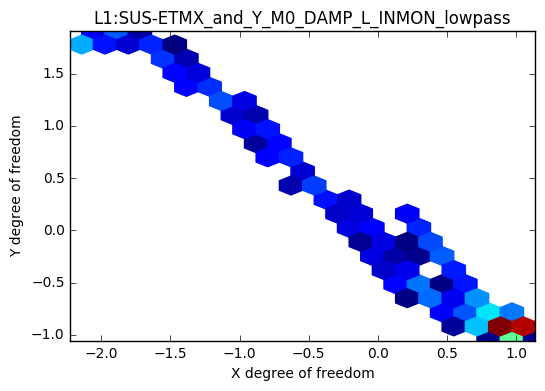

In [35]:
plt.hexbin(A_lp[:,20],A_lp[:,20+21],gridsize=20, mincnt=1)
plt.title('L1:SUS-ETMX_and_Y_M0_DAMP_L_INMON_lowpass') 
plt.xlabel('X degree of freedom')
plt.ylabel('Y degree of freedom')
plt.show()

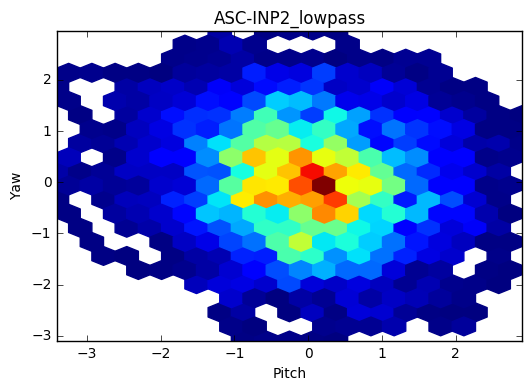

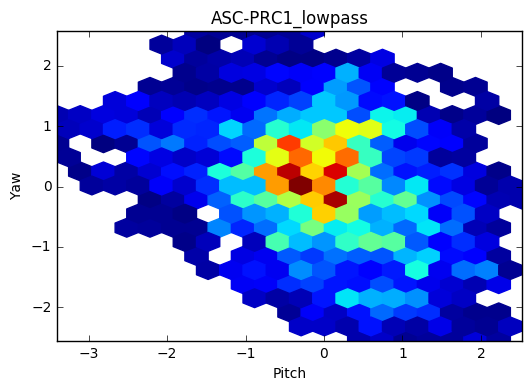

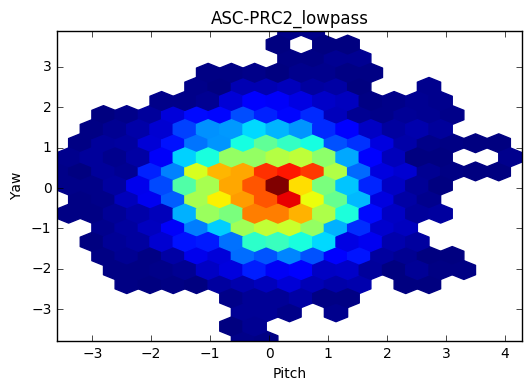

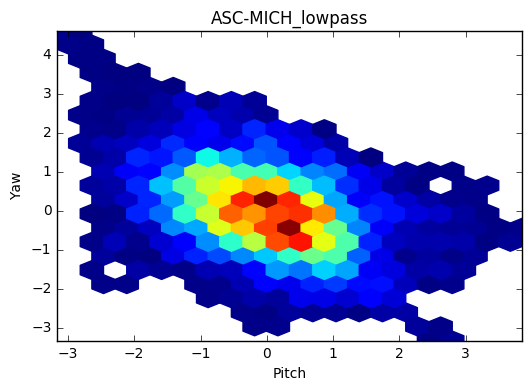

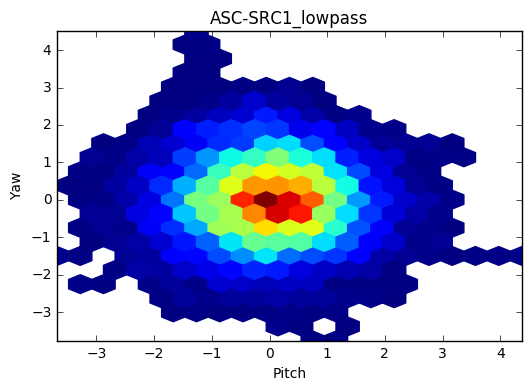

...

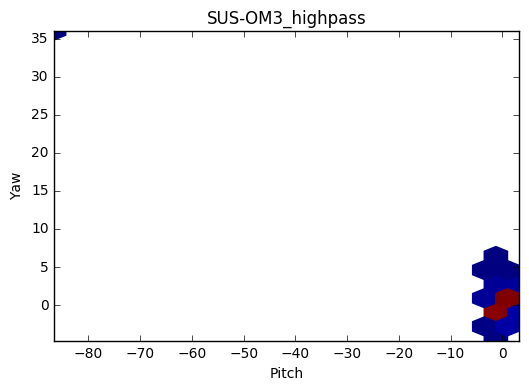

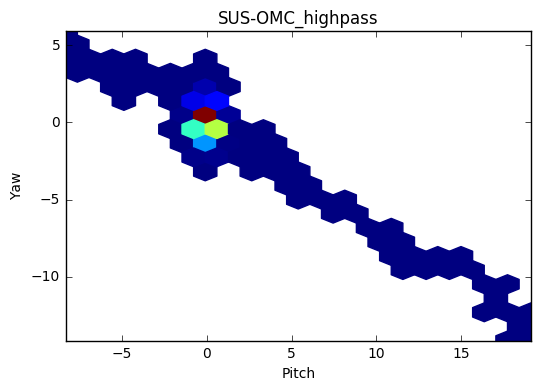

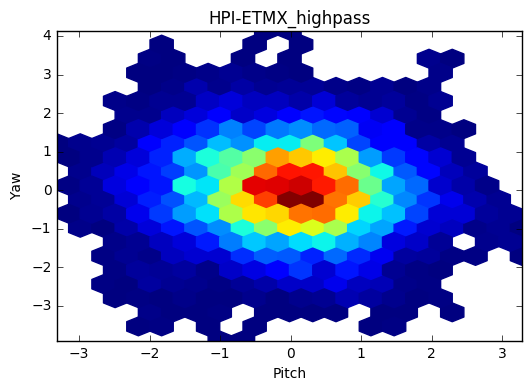

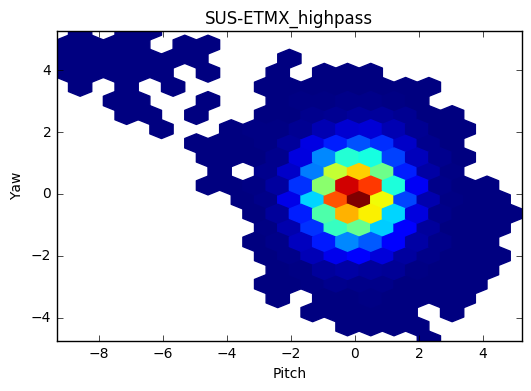

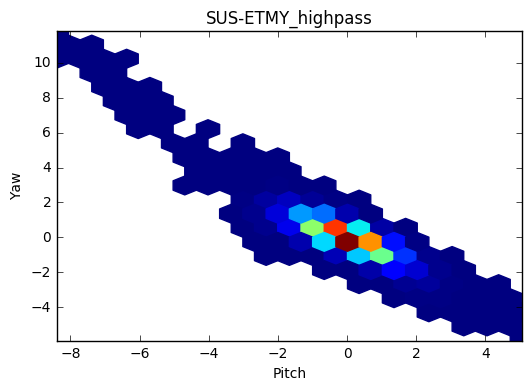

In [22]:
dens_plot(ch_list, A_lp, A_hp)

In [31]:
#DARM PCA computing

#Get Data

params = yaml.load(open("parameters_darm.txt","r"))
ch_list = params['channels'].split(',')
gps_s = params['GPS_start']
dur = params['duration']
data_darm = {}
ch_list_darm=[]
for ch in ch_list:
    ch_list_darm.append(ch)
ch_list_darm.append('GDS-CALIB_STRAIN')

for ch in ch_list:
    data_darm[ch] = TimeSeries.get('L1:%s.mean,s-trend' % ch,gps_s,gps_s+dur)
    
data_darm['GDS-CALIB_STRAIN'] = TimeSeries.get('L1:GDS-CALIB_STRAIN',1162528731,1162528731+7200)

#Getting DARM blrms info
filter_pad = 3 #Extra padding for applying the band-pass filter
stride = float(1) #Stride of the output time series in seconds. Fractional expressions are allowed, e.g. 1/16

bpdata = data_darm['GDS-CALIB_STRAIN'].bandpass(30,100)
bpdata = bpdata[int(filter_pad*data_darm['GDS-CALIB_STRAIN'].sample_rate.value):]
blrms_darm = bpdata.rms(stride)

#data_darm = pickle.load(open("darm_data.txt", "rb" ))
#blrms_darm = pickle.load(open("darm_blrms.txt", "rb"))



/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/astropy/units/quantity.py:913: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  out = super(Quantity, self).__getitem__(key)


NameError: name 'ch_darm_list' is not defined

In [34]:
#For DARM
#Subtracting out the mean and dividing by the standard deviation for each channel
data_darm_lp={}
data_darm_hp={}

for key, value in data_darm.iteritems(): 
    v = value

    #Apply low pass filter to data.
    filt_low=gwpy.timeseries.TimeSeries.lowpass(v-v[:600].mean(), 1./180, gstop=20, stop=2./180)[900:]
        
    meanaux_low=filt_low.mean() 
    stdaux_low=np.std(filt_low)
    datasub_low=np.subtract(filt_low, meanaux_low)
    datadiv_low=np.divide(datasub_low, stdaux_low) 
    
    #Apply high pass filter to data
    filt_high=gwpy.timeseries.TimeSeries.highpass(v, 1./300)[900:]
    
    meanaux_high=filt_high.mean() 
    stdaux_high=np.std(filt_high)
    datasub_high=np.subtract(filt_high, meanaux_high)
    datadiv_high=np.divide(datasub_high, stdaux_high)
    
    data_darm_lp[key] = datadiv_low
    data_darm_hp[key] = datadiv_high
    
#Storing cleaned data in list m_A
m_A_darm_lp=[]
m_A_darm_hp=[]


for ch in ch_list_darm:
    m_A_darm_lp.append(data_darm_lp[ch])
            
for ch in ch_list_darm:
    m_A_darm_hp.append(data_darm_hp[ch])

m_A_darm_lp.append(data_darm_lp)
m_A_darm_hp.append(data_darm_hp)

#Applying PCA to cleaned data
A_darm_lp = np.column_stack(m_A_darm_lp)
A_darm_hp = np.column_stack(m_A_darm_hp)

pca_darm_lp = PCA(n_components=20)
pca_darm_hp = PCA(n_components=20)

X_r_darm_lp = pca_darm_lp.fit(A_darm_lp).transform(A_darm_lp)
X_r_darm_hp = pca_darm_hp.fit(A_darm_hp).transform(A_darm_hp)


ValueError: all the input array dimensions except for the concatenation axis must match exactly

In [80]:
for j in range(2,4):
    print j

2
3


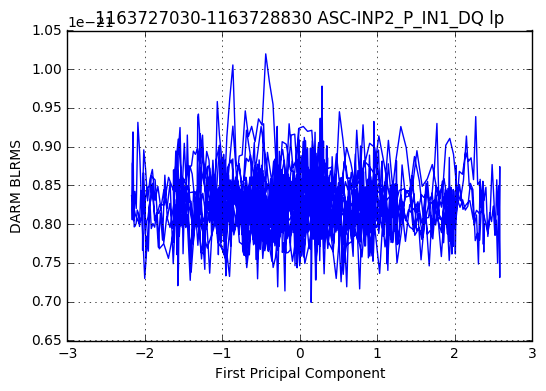

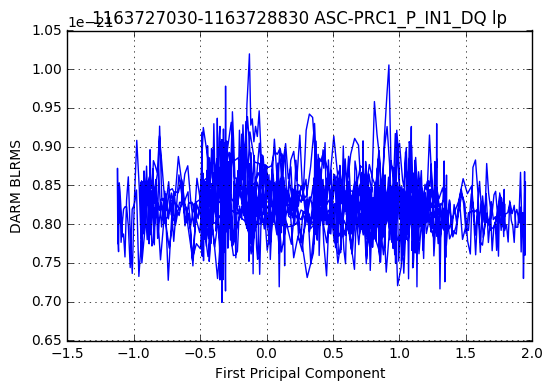

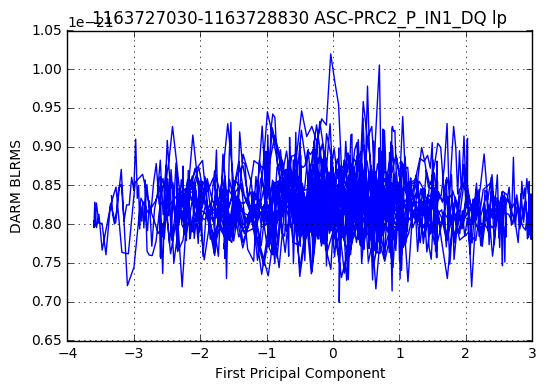

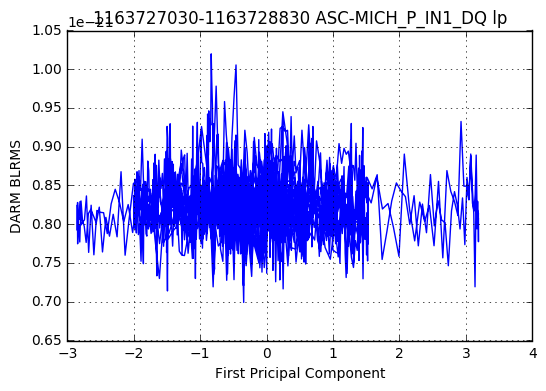

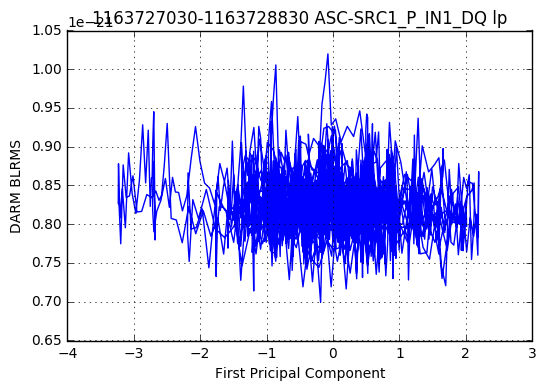

...

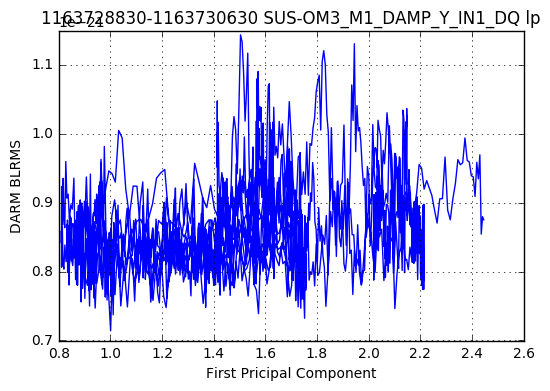

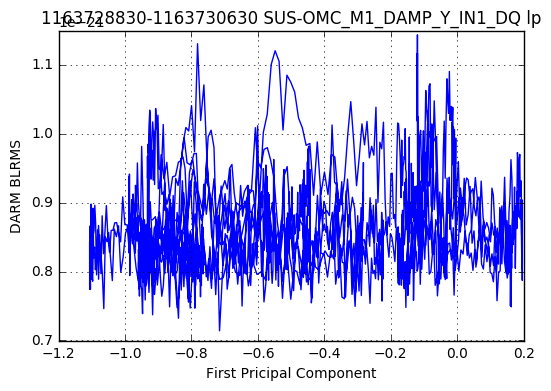

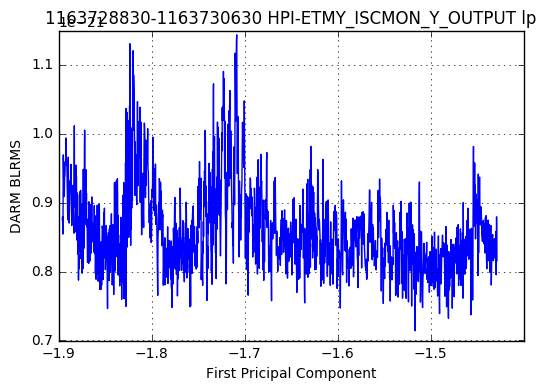

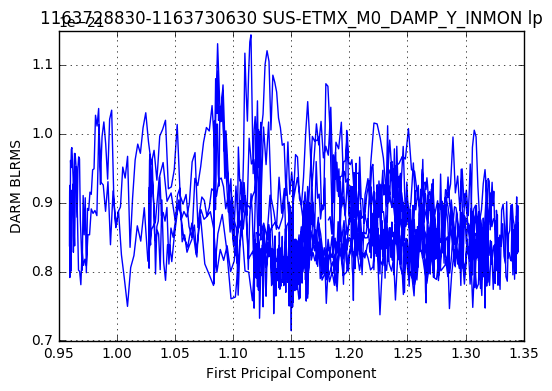

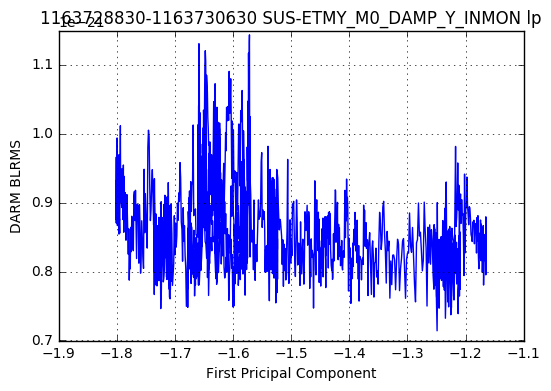

In [85]:
#Retrieve Channel BLRMS data
    
for j in range(0,2):
    blrms = {}
    filter_pad = 3 #Extra padding for applying the band-pass filter
    stride = float(1) #Stride of the output time series in seconds. Fractional expressions are allowed, e.g. 1/16
    blrms_gps_s = 1163727030+(1800*j)
    blrms_gps_e = 1163727030+1800+(1800*j)

    data_blrms = TimeSeries.fetch('L1:GDS-CALIB_STRAIN',blrms_gps_s,blrms_gps_e)
    bpdata = data_blrms.bandpass(30,50)
    bpdata = bpdata[int(filter_pad*data_blrms.sample_rate.value):]
    blrms['GDS-CALIB_STRAIN'] = bpdata.rms(stride)


    for idx in range(0,len(A_lp[0])):
        plt.plot(A_lp[900+3+(1800*j):900+3+1797+(1800*j),idx], blrms['GDS-CALIB_STRAIN'])
        plt.title('%s-%s %s lp' % (blrms_gps_s, blrms_gps_e, ch_list[idx]))
        plt.xlabel('First Pricipal Component')
        plt.ylabel('DARM BLRMS')
        plt.grid(True)
        plt.savefig('fig_blrms/%s-%s_lowpass_%s.png' % (blrms_gps_s,blrms_gps_e,ch_list[idx]))
        plt.show()

(51832, 42)


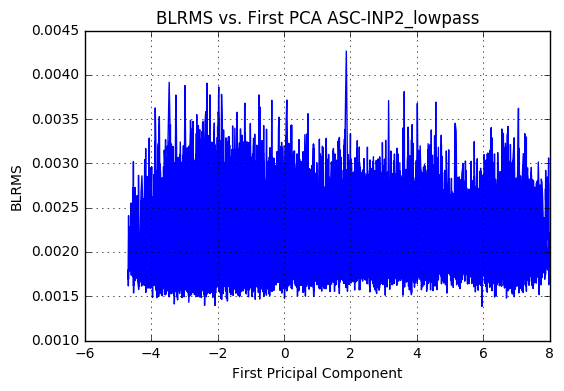

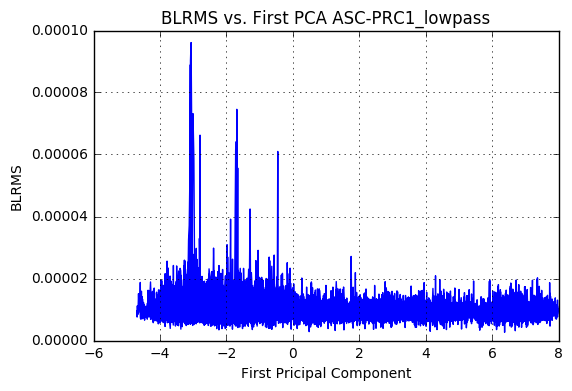

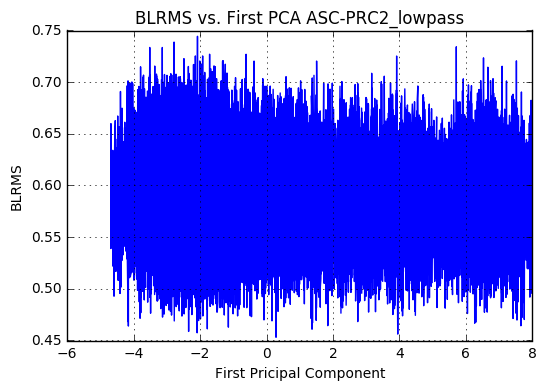

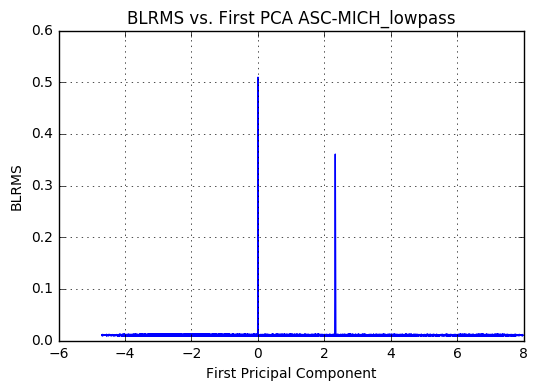

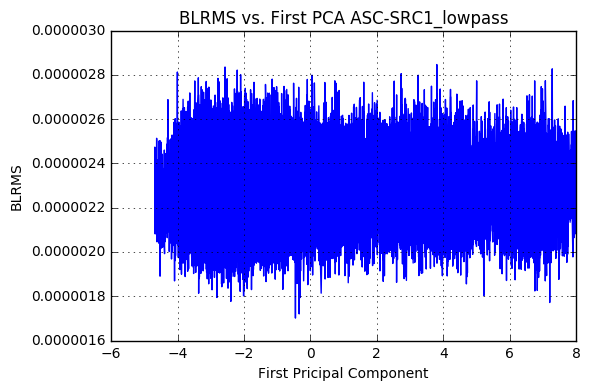

...

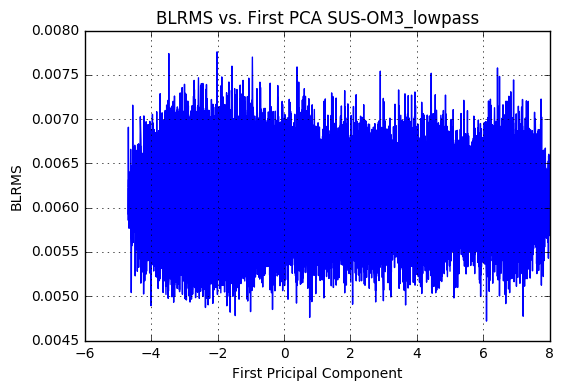

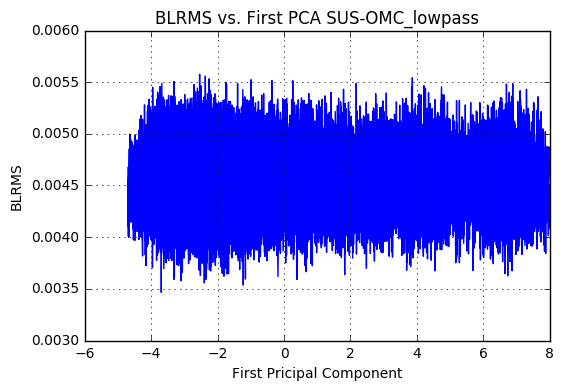

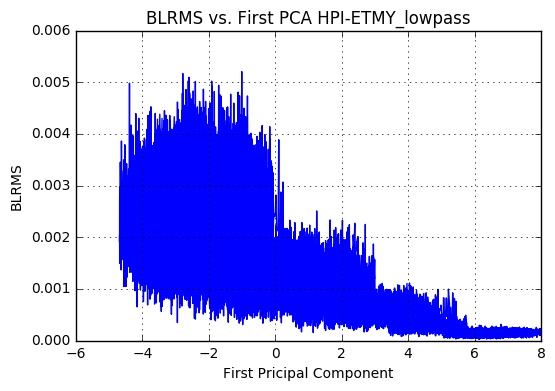

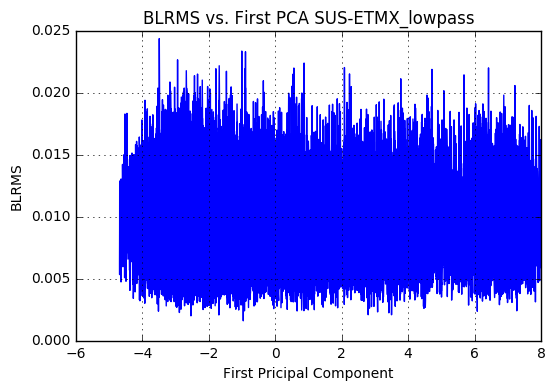

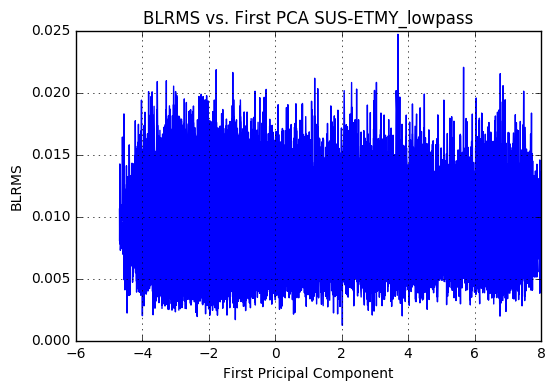

In [38]:
#X_r_lp[:,0] is the first principal compoenent.
blrms_A = []

for ch in ch_list:
    blrms_A.append(blrms[ch])

#len(blrms_A) = 42

blrms_A = np.column_stack(blrms_A)
print blrms_A.shape
first_chan = blrms_A[897:,1]


for idx in range(0,len(ch_list),1):
    plt.plot(X_r_lp[:,0], blrms_A[897:,idx])
    plt.title('BLRMS vs. First PCA %s_lowpass' % ch_list[idx].split('_')[0])
    plt.xlabel('First Pricipal Component')
    plt.ylabel('BLRMS')
    plt.grid(True)
    plt.show()
    plt.close()




In [10]:
#Determining Best Performing Channels in the first PC and then calculating the PSD

best_ch_lp = array(ch_list)[pca_lp.components_[0]**2>0.07]
best_ch_hp = array(ch_list)[pca_hp.components_[0]**2>0.07]

#How to determine the pca component values for top channels
print pca_lp.components_[0][pca_lp.components_[0]**2 > 0.07]**2

#Plottng the PSD of the best three performing channels
def psd_plot(best_ch_lp, best_ch_hp, data_lp, data_hp):
    plt.figure(1)
    if len(best_ch_lp)>=3:
        for idx in best_ch_lp[:3]:
            psd_lp = gwpy.timeseries.TimeSeries.psd(data_lp[idx],fftlength=256, overlap=128)
            plt.subplot(221)
            plt.loglog(psd_lp.frequencies, psd_lp.value)
            plt.title('PSD Lowpass')
            plt.grid(True)

    elif len(best_ch_lp)<3:
        for idx in len(best_ch_lp):
            psd_lp = gwpy.timeseries.TimeSeries.psd(data_lp[idx],fftlength=256, overlap=128)
            asd_lp = TimeSeries.asd(data_lp[idx],fftlength)
            plt.subplot(221)
            plt.loglog(psd_lp.frequencies, psd_lp.value)
            plt.title('PSD Lowpass')
            plt.grid(True)
    
    if len(best_ch_hp)>=3:
        for idx in best_ch_hp[:3]:
            psd_hp = gwpy.timeseries.TimeSeries.psd(data_hp[idx],fftlength=2048, overlap=1024)
            plt.subplot(222)
            plt.loglog(psd_hp.frequencies, psd_hp.value)
            plt.title('PSD Highpass')
            plt.grid(True)

    elif len(best_ch_hp)<3:
        for idx in len(best_ch_hp):
            psd_hp = gwpy.timeseries.TimeSeries.psd(data_hp[idx],fftlength=2048, overlap=1024)
            plt.subplot(222)
            plt.loglog(psd_hp.frequencies, psd_hp.value)
            plt.title('PSD Highpass')
            plt.grid(True)
    return

#axarr[0].set_xlim([0,1400])

#axarr[0].set_title('Sharing X axis')

[ 0.08948588  0.08115091  0.08964986  0.09163655  0.07444124
  0.07122136  0.09036317  0.09114309]


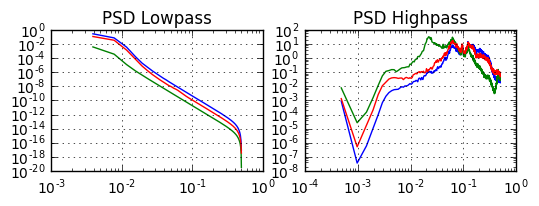

In [11]:
psd_plot(best_ch_lp, best_ch_hp, data_lp, data_hp)

In [12]:
#This section is a work in progress

#Determining Best Performing Channels in the first PC and then calculating the PSD

best_ch_lp = array(ch_list)[pca_lp.components_[0]**2>0.07]
best_ch_hp = array(ch_list)[pca_hp.components_[0]**2>0.07]

#Plottng the ASD of the best three performing channels
def asd_plot(best_ch_lp, best_ch_hp, data_lp, data_hp):
    plt.figure(2)
    if len(best_ch_lp)>=3:
        for idx in best_ch_lp[:3]:
            asd_lp = TimeSeries.asd(data_lp[idx],fftlength=256, overlap=128, method='welch')
            print idx
            plt.subplot(221)
            plt.loglog(asd_lp.frequencies, asd_lp.value)
            plt.title('ASD Lowpass')
            plt.grid(True)

    elif len(best_ch_lp)<3:
        for idx in len(best_ch_lp):
            asd_lp = TimeSeries.asd(data_lp[idx],fftlength=256, overlap=128, method='welch')
            plt.subplot(221)
            plt.loglog(asd_lp.frequencies, asd_lp.value)
            plt.title('ASD Lowpass')
            plt.grid(True)
    
    if len(best_ch_hp)>=3:
        for idx in best_ch_hp[:3]:
            asd_hp = TimeSeries.asd(data_hp[idx],fftlength=2048, overlap=1024, method='welch')
            plt.subplot(222)
            plt.loglog(asd_hp.frequencies, asd_hp.value)
            plt.title('ASD Highpass')
            plt.grid(True)

    elif len(best_ch_hp)<3:
        for idx in len(best_ch_hp):
            asd_hp = TimeSeries.asd(data_hp[idx],fftlength=2048, overlap=1024, method='welch')
            plt.subplot(222)
            plt.loglog(asd_hp.frequencies, asd_hp.value)
            plt.title('ASD Highpass')
            plt.grid(True)
    return


SUS-OMC_M1_DAMP_P_IN1_DQ
HPI-ETMX_ISCMON_X_OUTPUT
SUS-ETMX_M0_DAMP_R_INMON


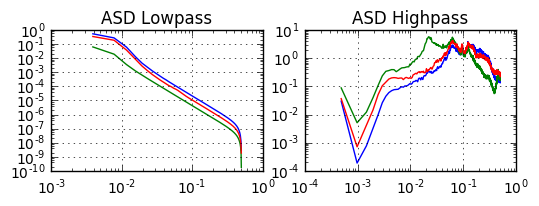

In [13]:
asd_plot(best_ch_lp, best_ch_hp, data_lp, data_hp)

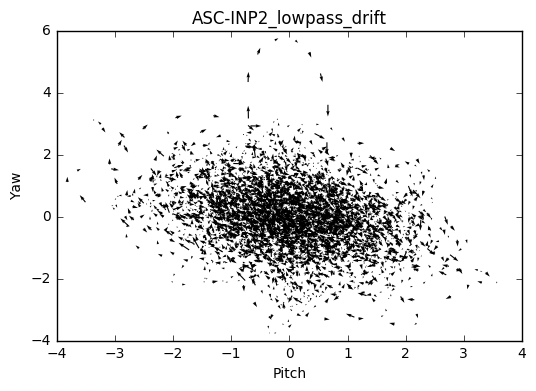

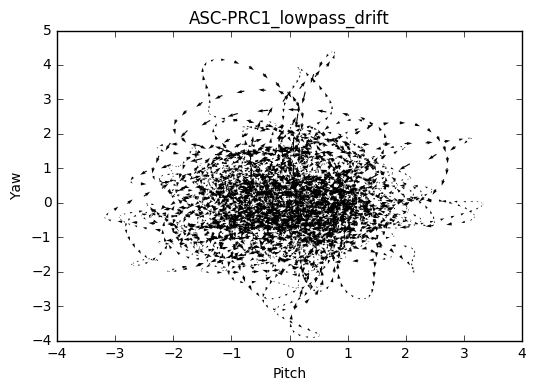

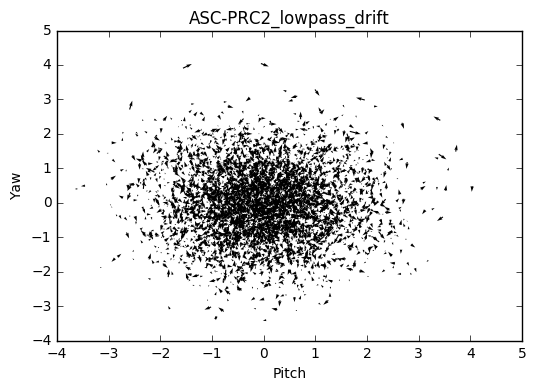

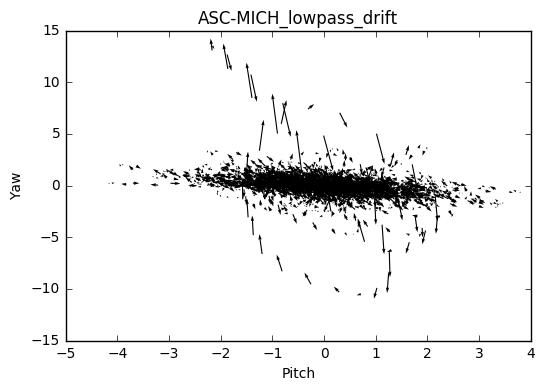

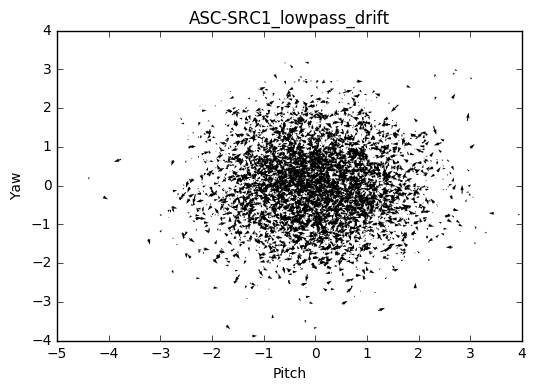

...

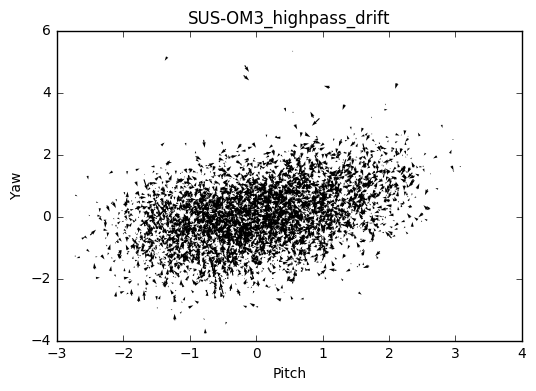

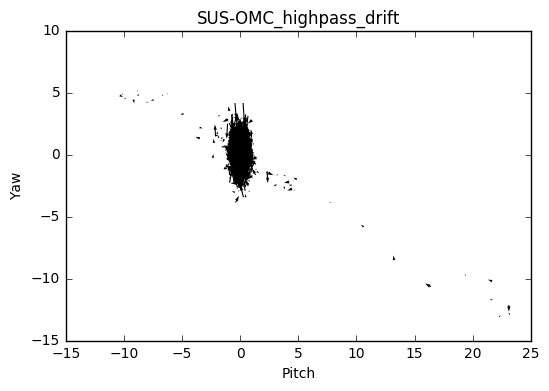

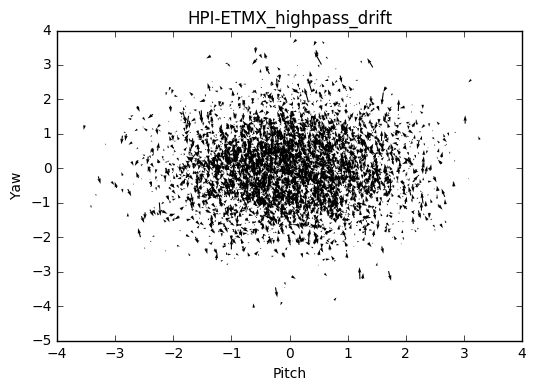

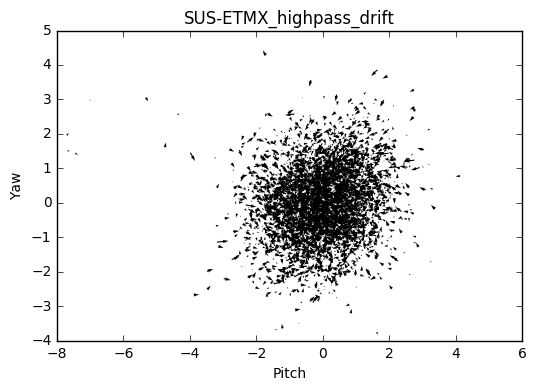

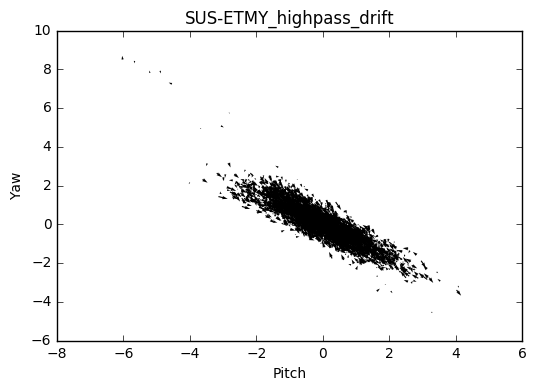

In [14]:
#Drift Monitoring for each degree of freedom

#lowpass
for idx in range(0,len(ch_list)-21,1):
    xarr=A_lp[:,idx].value
    yarr=A_lp[:,idx+21].value
    plt.quiver(xarr[:-1:10],yarr[:-1:10],diff(xarr)[::10],diff(yarr)[::10])
    plt.title('%s_lowpass_drift' % ch_list[idx].split('_')[0])
    plt.xlabel('Pitch')
    plt.ylabel('Yaw')
    plt.show()
    plt.savefig('figs/%s_lp_drift.png' % ch_list[idx].split('_')[0])
    
#highpass
for idx in range(0,len(ch_list)-21,1):
    xarr=A_hp[:,idx].value
    yarr=A_hp[:,idx+21].value
    plt.quiver(xarr[:-1:10],yarr[:-1:10],diff(xarr)[::10],diff(yarr)[::10])
    plt.title('%s_highpass_drift' % ch_list[idx].split('_')[0])
    plt.xlabel('Pitch')
    plt.ylabel('Yaw')
    plt.show()
    plt.savefig('figs/%s_hp_drift.png' % ch_list[idx].split('_')[0])


In [ ]:
#Plotting band-limited rms as a function of the PCAs for each channel

#lowpass
for idx in range(0,len(ch_list)-21,1):
    
    
#highpass

In [33]:
#Playing with SVM
from sklearn import svm
from sklearn.svm import SVR
y_lab=range(0,20
            700)

clf_rbf=svm.SVR(kernel='poly')
svr_rbf=clf.fit(test_svm, y_lab).predict(test_svm)

/Users/hg/Library/Python/2.7/lib/python/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


ValueError: X.shape[1] = 20700 should be equal to 72, the number of features at training time

In [27]:
shape(svr_rbf)

(20700,)

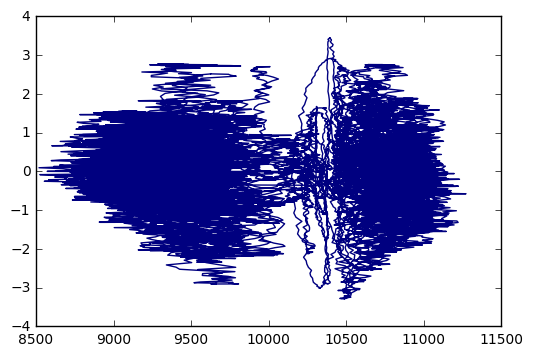

In [32]:
lw=2
plt.plot(y_lab, test_svm[:,0], color='darkorange', label='data')
plt.hold('on')
plt.plot(svr_rbf, test_svm[:,0], color='navy', label='RBF model')

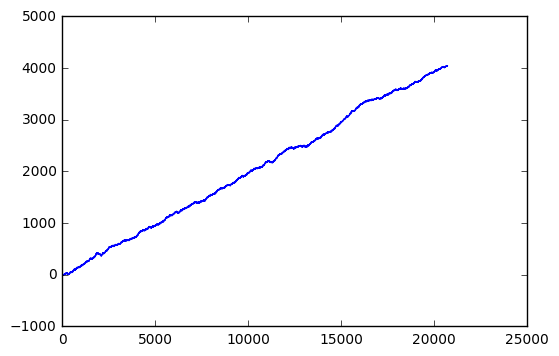

In [25]:
plt.plot(unwrap(angle(X_r_hp[:,9]+1.j*X_r_hp[:,8])))

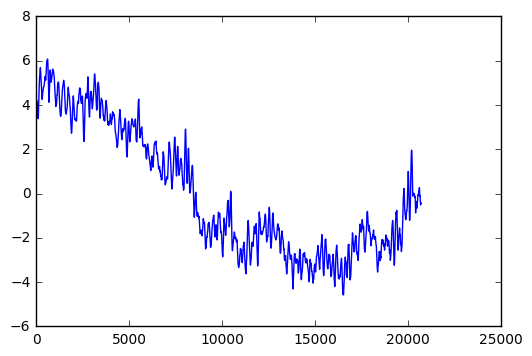

In [26]:
plt.plot(X_r_lp[:,0])

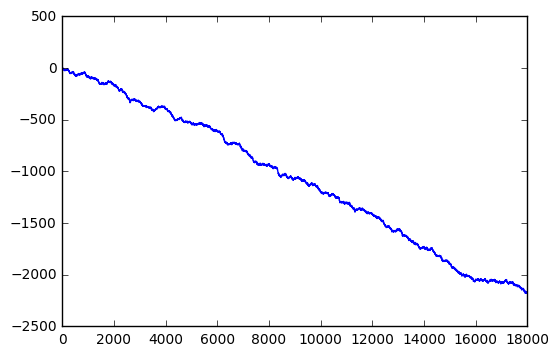

In [18]:
#plt.plot(unwrap(angle(X_r[:,2]+1.j*X_r[:,3])))

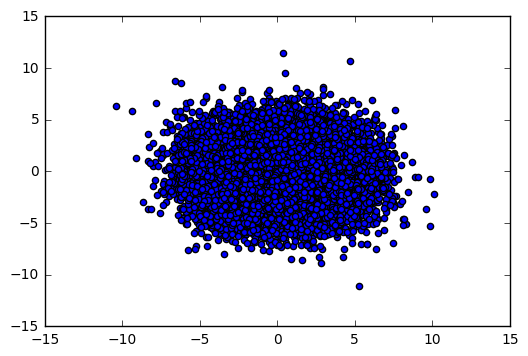

In [29]:
plt.scatter(X_r_hp[:,0],X_r_hp[:,1])

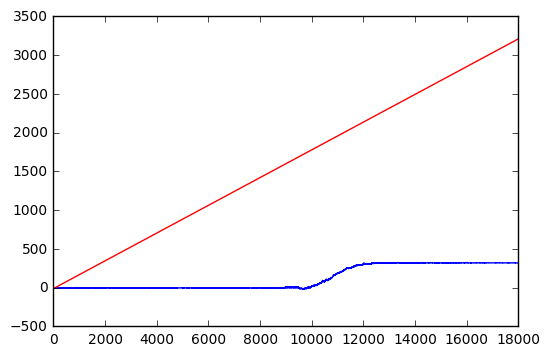

In [19]:
#tarr=arange(len(X_r[:,0]))
#plt.plot(unwrap(arctan2(X_r[:,1],X_r[:,0])))
#plt.plot(tarr,0.179*tarr-11.174,c='r')

In [22]:
#for idx in range(len(ch_list)):
#    print ch_list[idx], pca_lp.components_[0,idx:idx+2], pca_lp.components_[1,idx:idx+2]

ASC-INP2_P_IN1_DQ

NameError: name 'pca_lp' is not defined

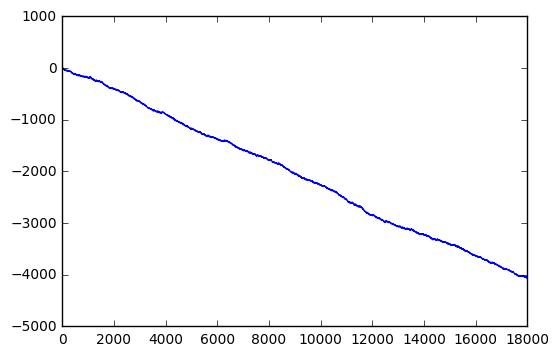

In [22]:
#plt.plot(unwrap(angle(X_r[:,1]+1.j*X_r[:,2])))

In [20]:
#polyfit(tarr,unwrap(angle(X_r[:,2]+1.j*X_r[:,3])),1)

array([ -0.12774962,  76.21326037])

In [74]:
#f01 = fft((X_r[:,2]+1.j*X_r[:,3])-mean(X_r[:,2]+1.j*X_r[:,3]))

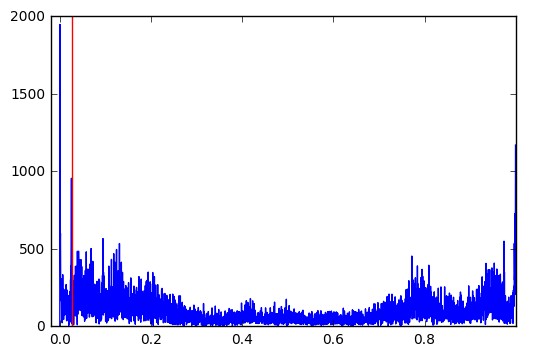

In [76]:
#plt.plot(arange(3600)/3600.,abs(f01))
#plt.gca().set_xlim(-.02,1)
#plt.gca().axvline(0.026,c='r')

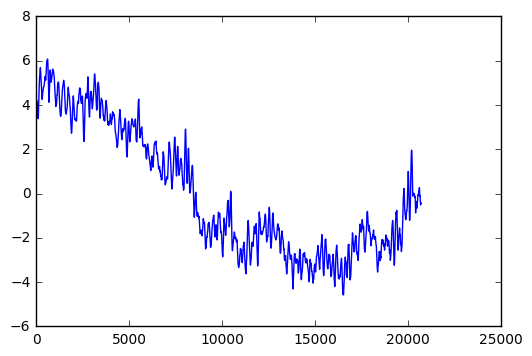

In [32]:
plt.plot(X_r_lp[:,0])

In [30]:
#pc0=pca.components_[0]
#pc1=pca.components_[1]
#pc2=pca.components_[2]

In [ ]:
if __name__ == "__main__":
    